# What?

**Stand:** 27/06/27

Von jedem Video wurde der erste Frame bestimmt. Dann wurde mittels `findTransformECC` die Transformation von zeitlich aufeinanderfolgender Frames bestimmt. (Für das feststellen der Transformation wurde aus Geschwindigkeitsgründen lediglich das Modell der **Translation** verwendet)

* [Cam_0 und Cam_1](#Cam_0-und-Cam_1)
* [Cam_2 und Cam_3](#Cam_2-und-Cam_3)

In [1]:
%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import datetime

import iso8601
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import modules.analyse_ecc as aecc

In [2]:
sns.set_style("darkgrid")

In [3]:
def display_one_day(df, start_time, camera_ids, ylim=None):
    colors = ['green', 'purple', 'blue', 'red']
    time_delta = datetime.timedelta(days=1, hours=1)
    end_time = start_time + time_delta
    # for i in range(2):
    fig, axes = plt.subplots(ncols=1, figsize=(16,8))
    for i, cam_id in enumerate(camera_ids):
        data = df[df['curr_cam_id'] == cam_id].copy()
        one_day = data[(data['curr_start_ts'] >= start_time) & (data['curr_start_ts'] < end_time)]
        one_day.index = one_day['curr_start_ts']
        distance_str = 'distance_cam_' + str(cam_id)
        one_day = one_day.rename(columns={'distance':distance_str})
        if not one_day.empty:
            title = str(start_time)
            if i == 0:
                one_day[[distance_str]].plot.area(x_compat=True, title=title, ylim=ylim,ax=axes, stacked=False, figsize=(16, 10), color=colors[i], label='bla')
            else:
                one_day[[distance_str]].plot.area(x_compat=True, title=title, ylim=ylim, ax=axes, stacked=False, color=colors[i])
    plt.show()

In [4]:
path_0 = 'derived_data/03_ecc_similarity_per_video/Cam_0.csv'
path_1 = 'derived_data/03_ecc_similarity_per_video/Cam_1.csv'
path_2 = 'derived_data/03_ecc_similarity_per_video/Cam_2.csv'
path_3 = 'derived_data/03_ecc_similarity_per_video/Cam_3.csv'
paths=[path_0, path_1, path_2, path_3]

In [5]:
all_data = []
for path in paths:
    df_cam = aecc.load_and_prepare(path)
    all_data.append(df_cam)

In [6]:
df = pd.concat(all_data, ignore_index=True)

In [7]:
df_disp = df.copy()
df_disp = df_disp[['curr_start_ts', 'curr_cam_id', 'distance']]
max_days = (df['curr_start_ts'].max() - df['curr_start_ts'].min()).days

# Cam_0 und Cam_1

Lade List mit den Tagen an welchen manuell eine Bewegung festgestellt wurde.

In [8]:
df_man_list = pd.read_pickle('./derived_data/02_man_marked_moved_frames/02b_df_man_marked_list.pkl')

In [9]:
def color_movement_red(val):
    if pd.isnull(val):
        color = 'yellow'
    elif val:
        color = 'red'
    else:
        color = 'white'
    # color = 'red' if val else 'white'
    return 'background-color: %s' % color

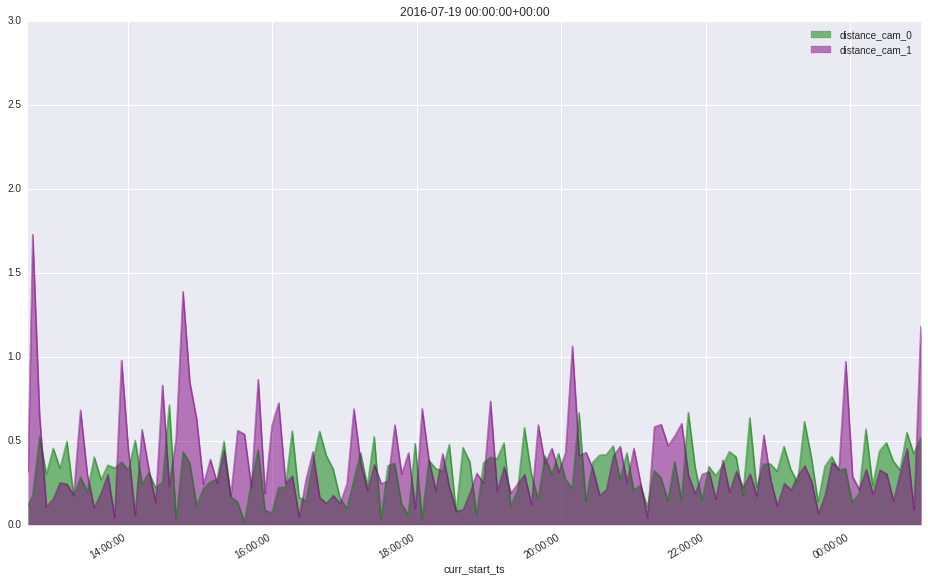

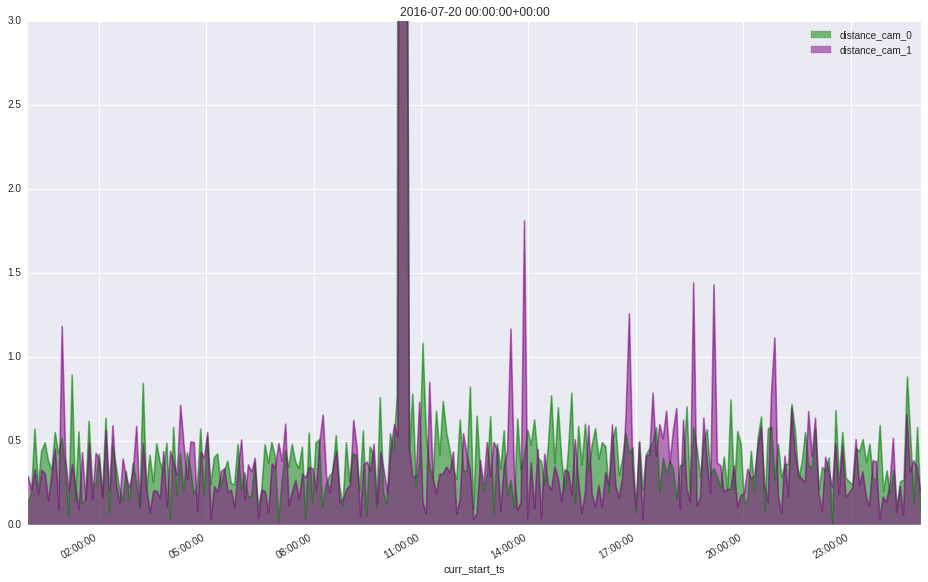

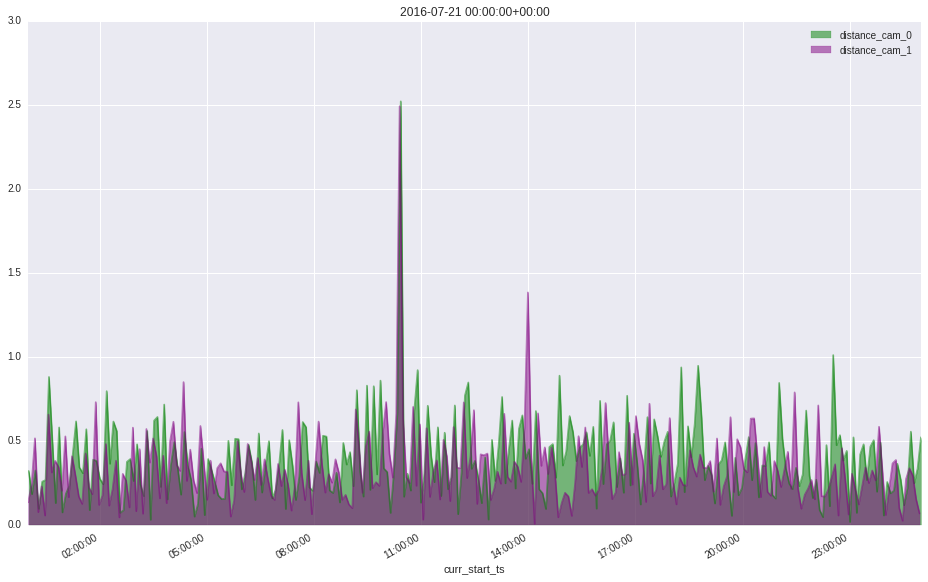

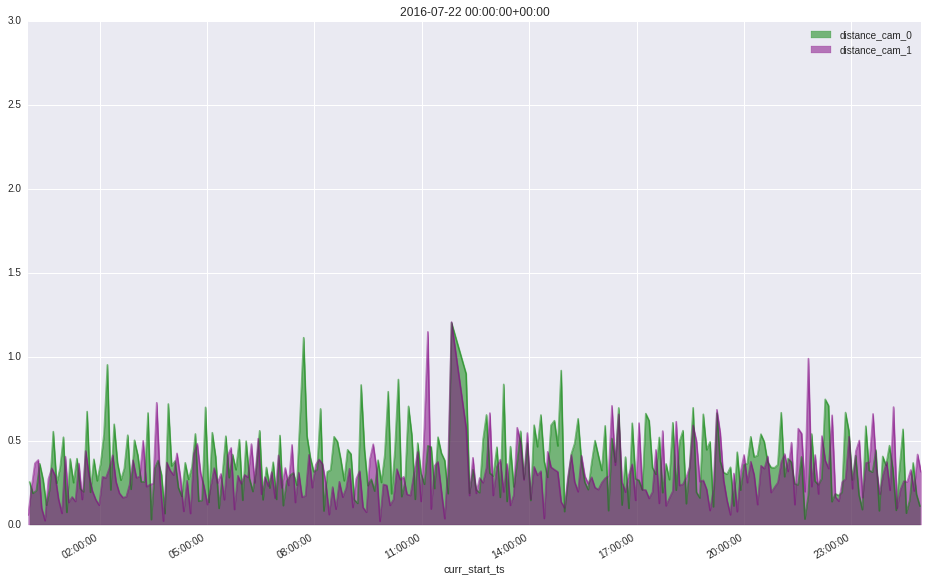

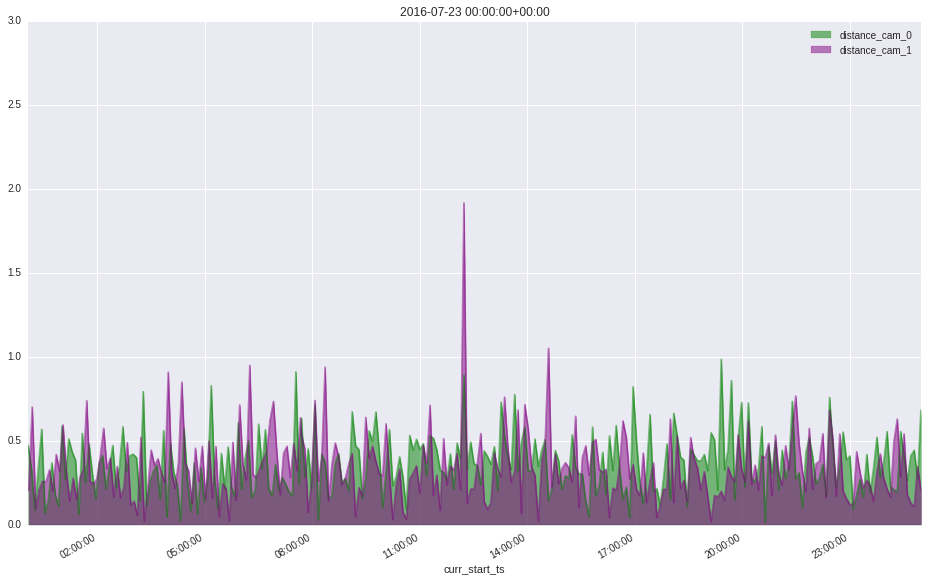

...

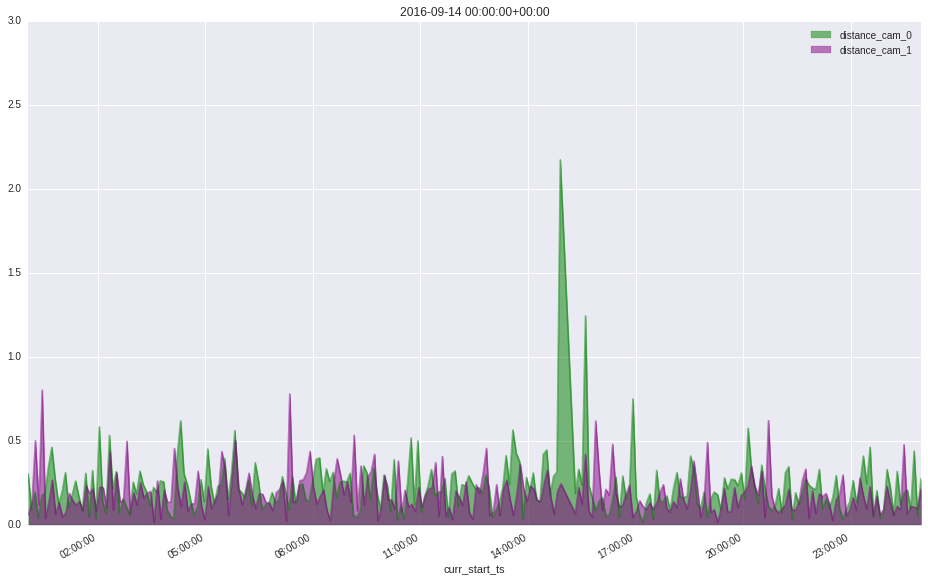

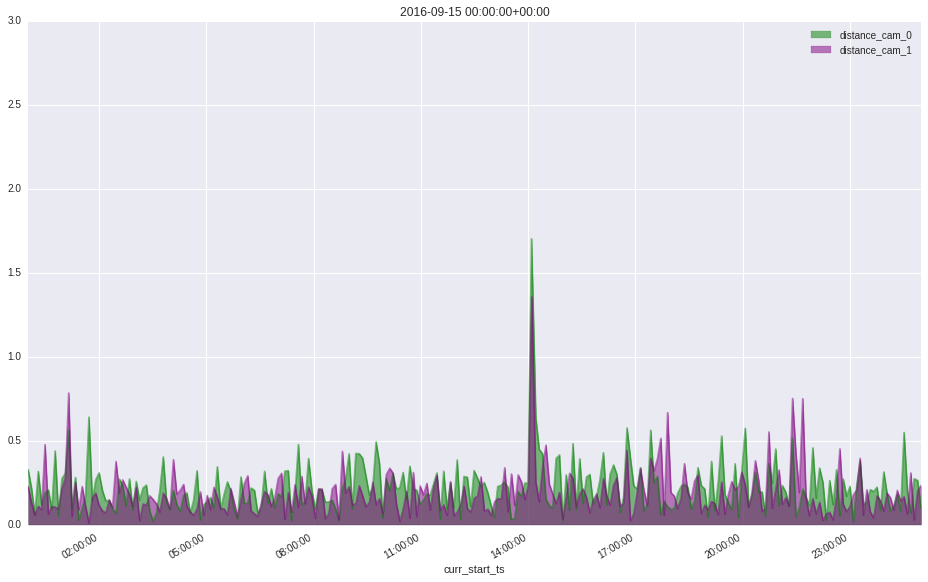

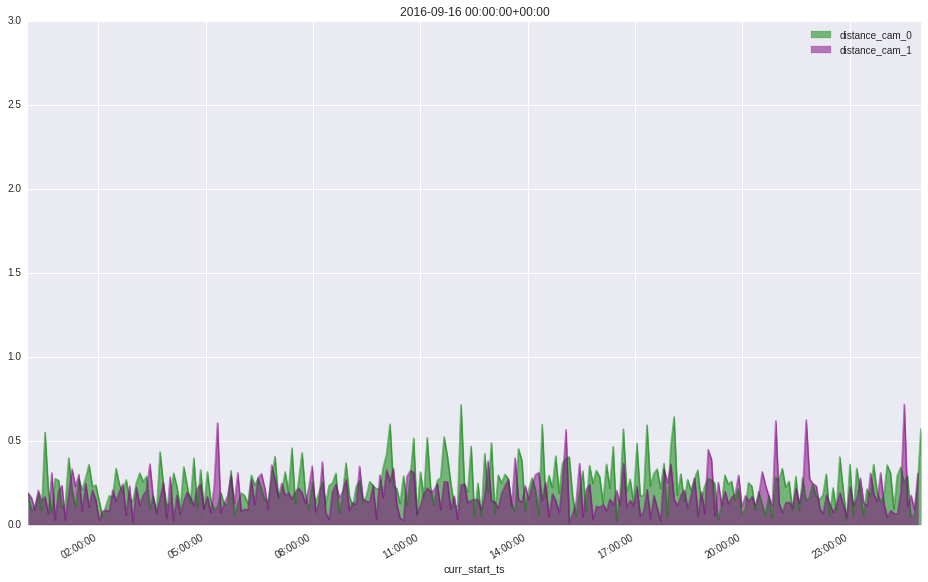

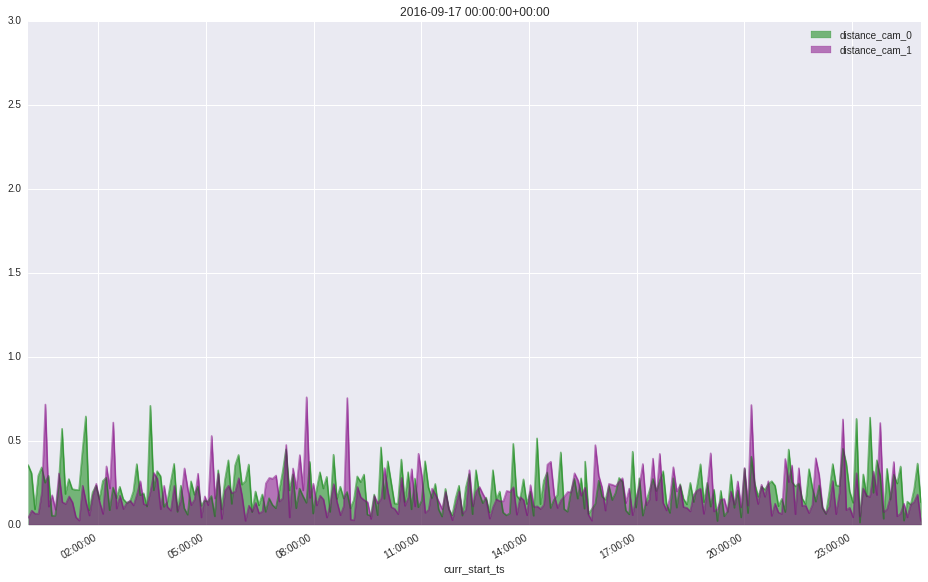

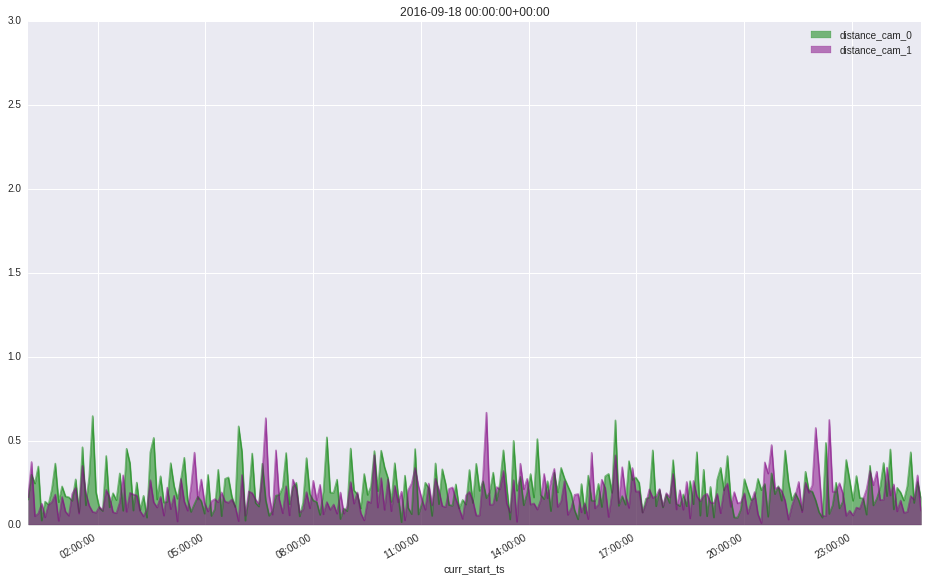

In [10]:
curr_day = iso8601.parse_date('2016-07-19')
for i in range(max_days+1):
    display_one_day(df_disp, curr_day,[0,1], ylim=[0,3])
    if len(df_man_list[df_man_list['proxy_day']==curr_day.strftime("%Y-%m-%d")]) > 0:
        df_man_list[df_man_list['proxy_day']==curr_day.strftime("%Y-%m-%d")].style.applymap(color_movement_red, subset=['moved_cam_0','moved_cam_1','moved_cam_2','moved_cam_3'])
    time_delta = datetime.timedelta(days=1)
    curr_day = curr_day + time_delta

# Cam_2 und Cam_3

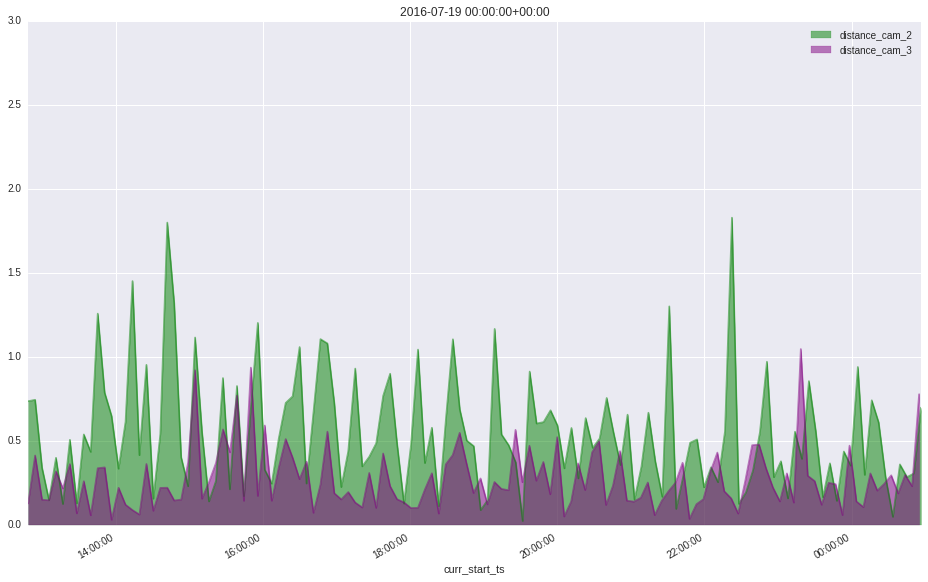

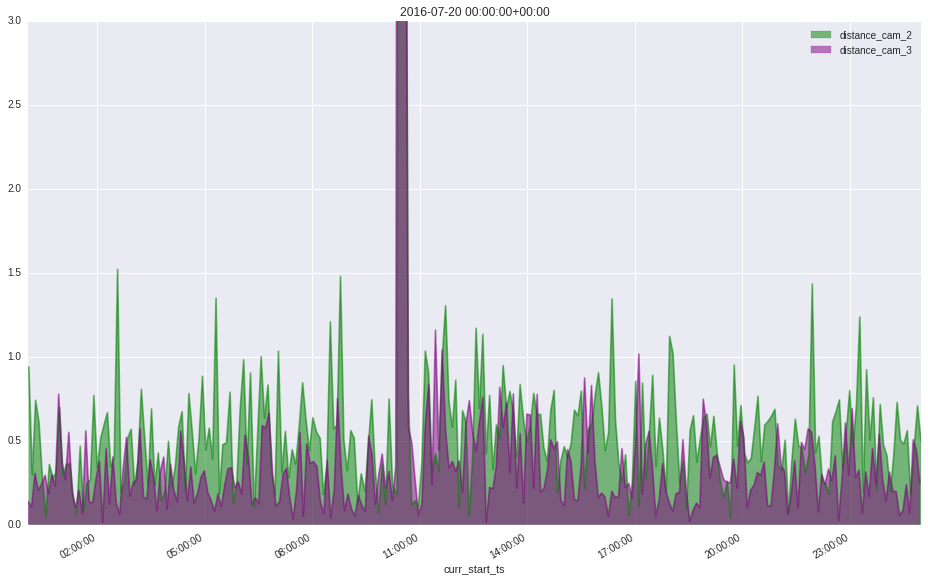

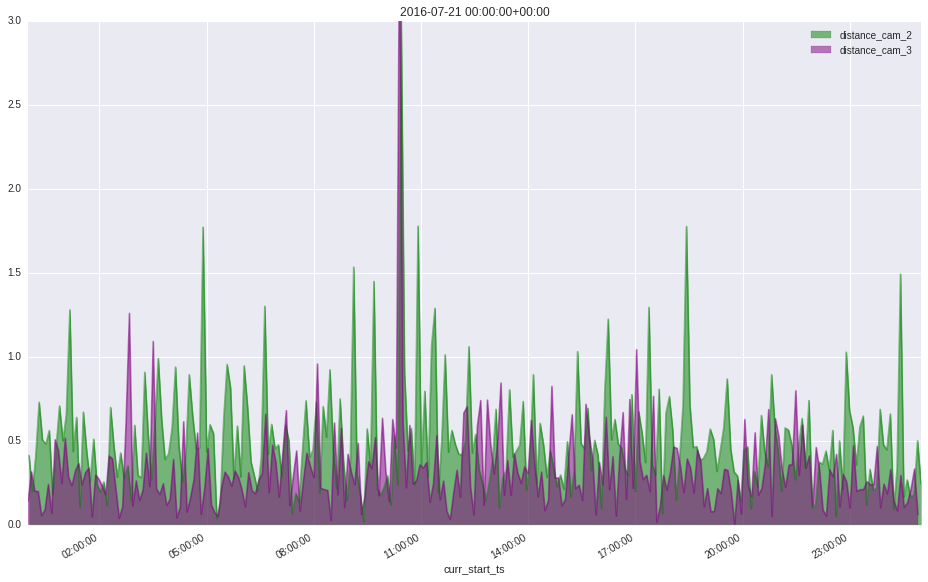

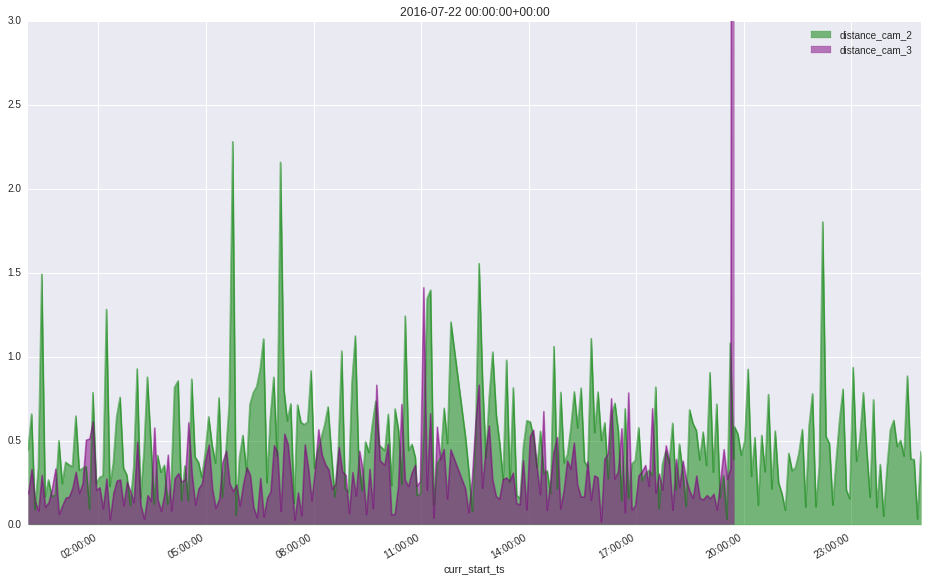

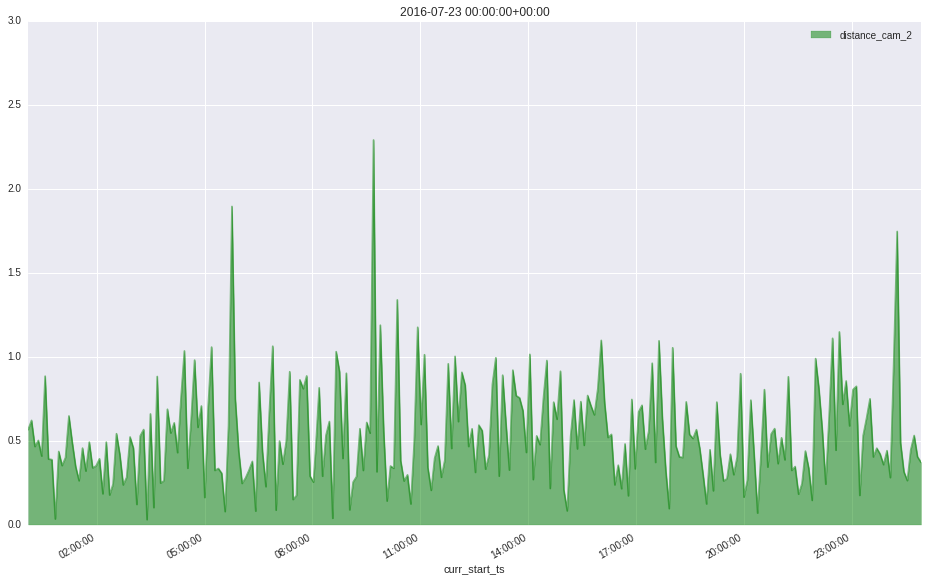

...

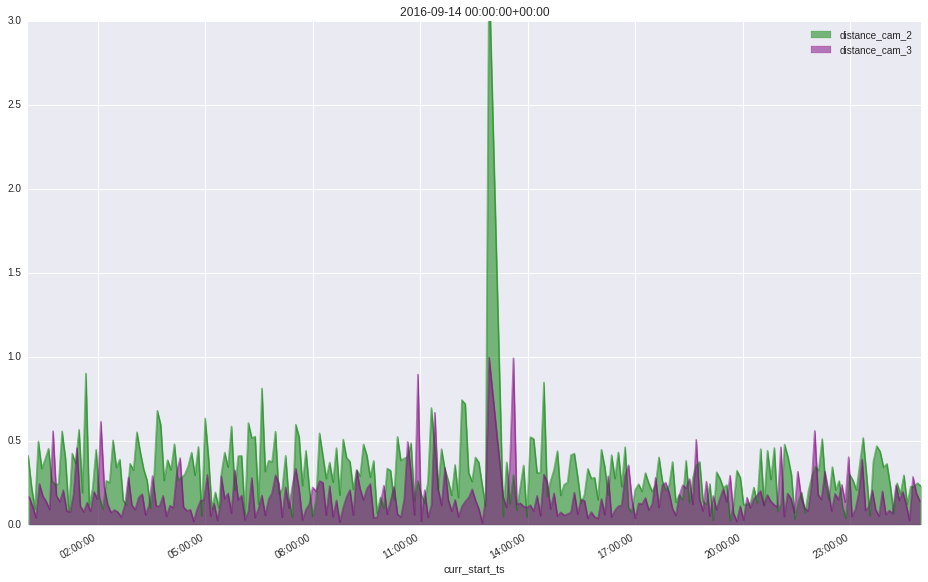

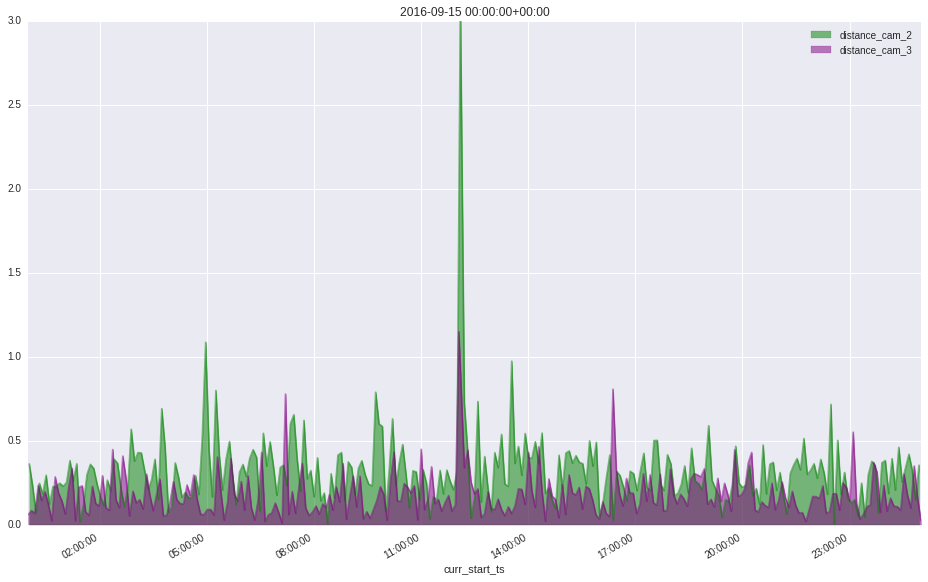

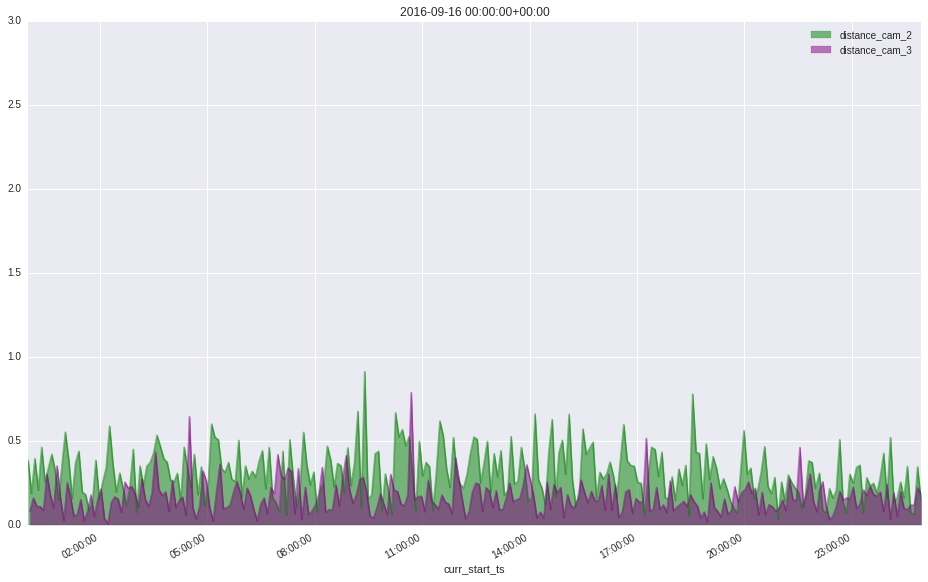

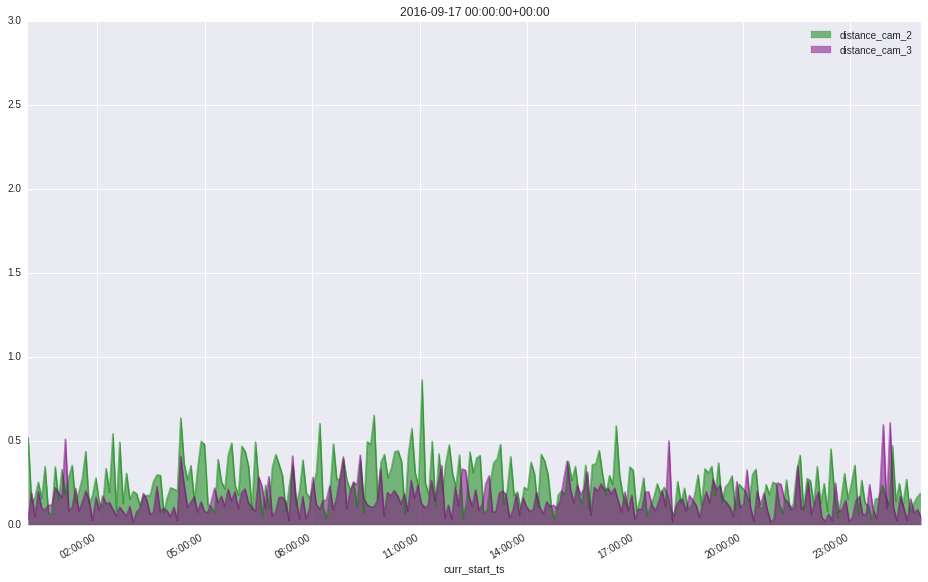

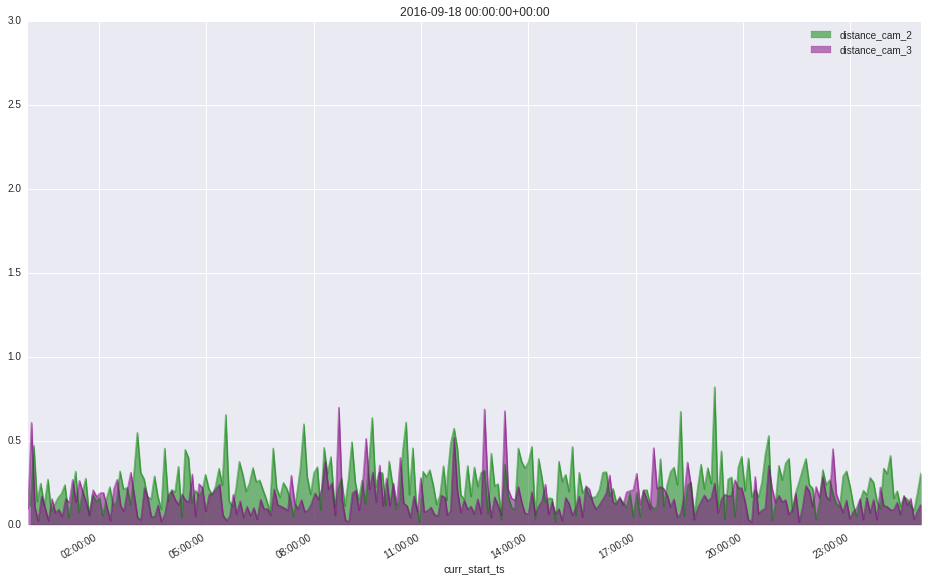

In [11]:
curr_day = iso8601.parse_date('2016-07-19')
for i in range(max_days+1):
    display_one_day(df_disp, curr_day,[2,3], ylim=[0,3])
    if len(df_man_list[df_man_list['proxy_day']==curr_day.strftime("%Y-%m-%d")]) > 0:
        df_man_list[df_man_list['proxy_day']==curr_day.strftime("%Y-%m-%d")].style.applymap(color_movement_red, subset=['moved_cam_0','moved_cam_1','moved_cam_2','moved_cam_3'])
    time_delta = datetime.timedelta(days=1)
    curr_day = curr_day + time_delta

count    58441.000000
mean         0.266349
std          3.812466
min          0.000341
25%          0.087770
50%          0.152982
75%          0.264327
max        577.042257
Name: distance, dtype: float64

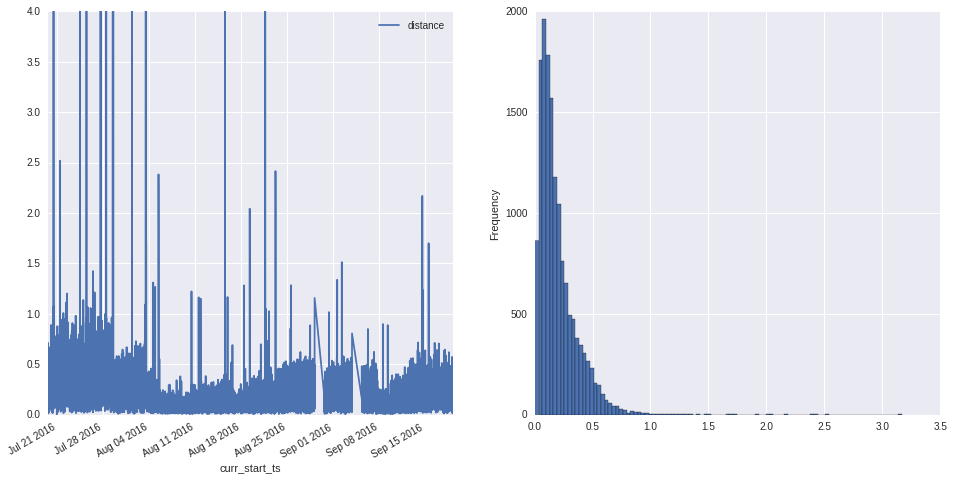

In [12]:
%matplotlib inline
fig, axes = plt.subplots(ncols=2, figsize=(16,8))
df[df['curr_cam_id']==0].plot(x=['curr_start_ts'], y=['distance'], ax=axes[0], ylim=[0,4])
df[(df['distance']< 4) & (df['curr_cam_id']==0)]['distance'].plot.hist(bins=100, ax=axes[1])
df['distance'].describe()

count    58441.000000
mean         0.266349
std          3.812466
min          0.000341
25%          0.087770
50%          0.152982
75%          0.264327
max        577.042257
Name: distance, dtype: float64

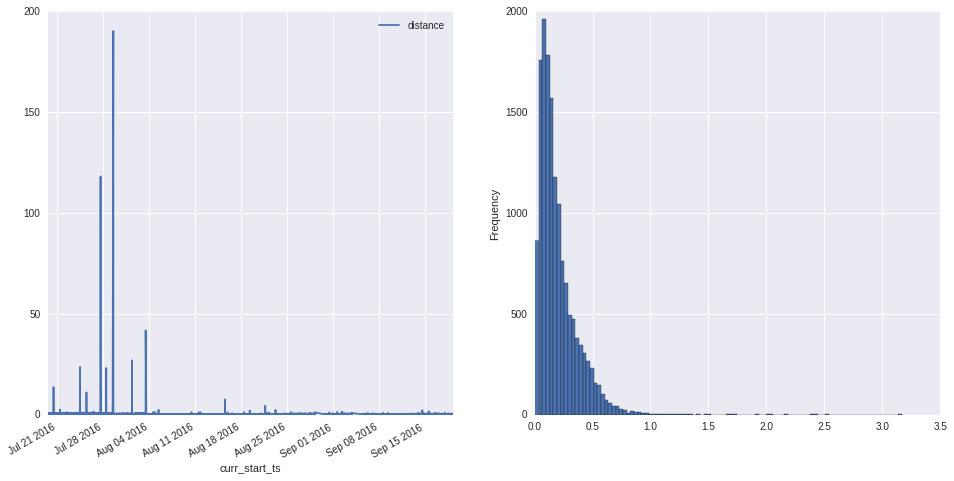

In [13]:
%matplotlib inline
fig, axes = plt.subplots(ncols=2, figsize=(16,8))
df[df['curr_cam_id']==0].plot(x=['curr_start_ts'], y=['distance'], ax=axes[0])
df[(df['distance']< 4) & (df['curr_cam_id']==0)]['distance'].plot.hist(bins=100, ax=axes[1])
df['distance'].describe()

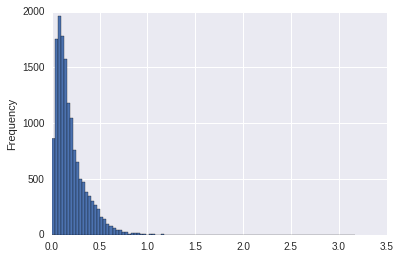

In [14]:
%matplotlib inline
df[(df['distance']< 4) & (df['curr_cam_id']==0)]['distance'].plot.hist(bins=100)

In [15]:
import datetime
import iso8601
def display_one_day(df, cam_id, start_time, ylim=None):
    time_delta = datetime.timedelta(days=1, hours=1)
    end_time = start_time + time_delta
    data = df[df['curr_cam_id'] == cam_id].copy()
    one_day = data[(data['curr_start_ts'] >= start_time) & (data['curr_start_ts'] < end_time)]
    one_day.index = one_day['curr_start_ts']
    one_day['mean'] = one_day['distance'].mean()
    if not one_day.empty:
        title = str(start_time)
        one_day[['distance', 'mean']].plot(x_compat=True, title=title, ylim=ylim)
        plt.show()